### Part 1

In [186]:
import cv2
import os
import matplotlib.pyplot as plt

Plotting images from subdirectory: altar


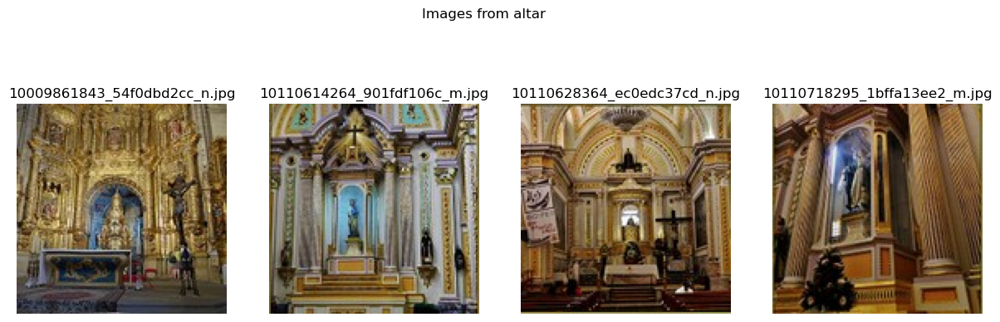

Plotting images from subdirectory: apse


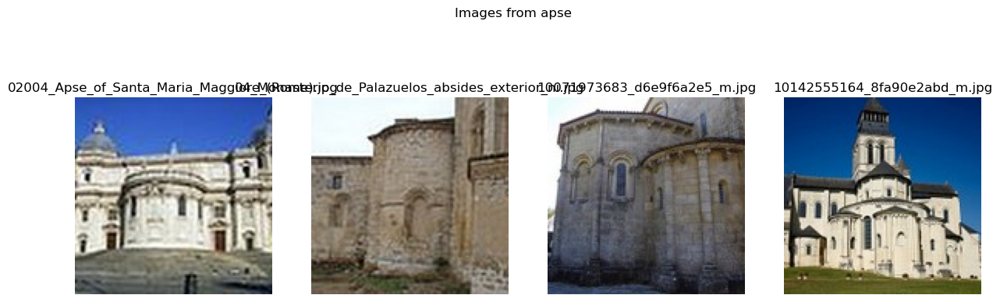

Plotting images from subdirectory: bell_tower


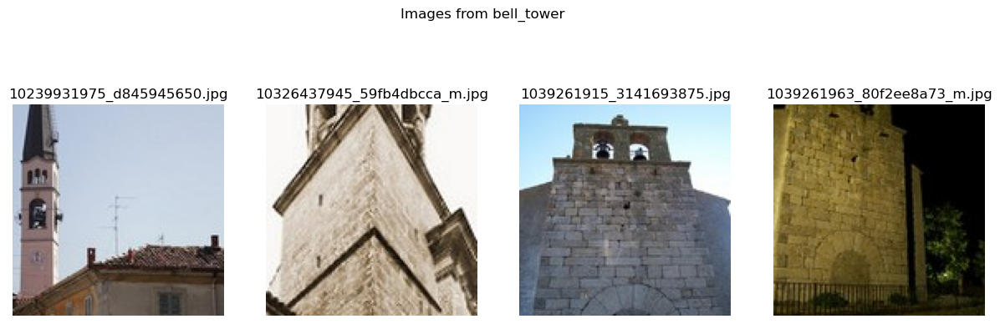

Plotting images from subdirectory: column


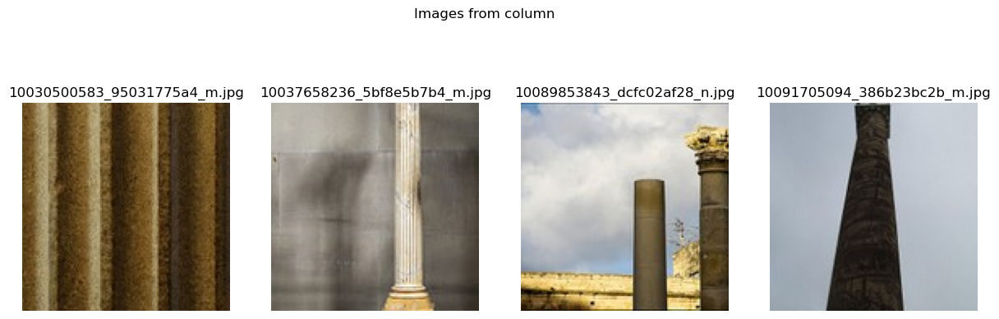

Plotting images from subdirectory: dome(inner)


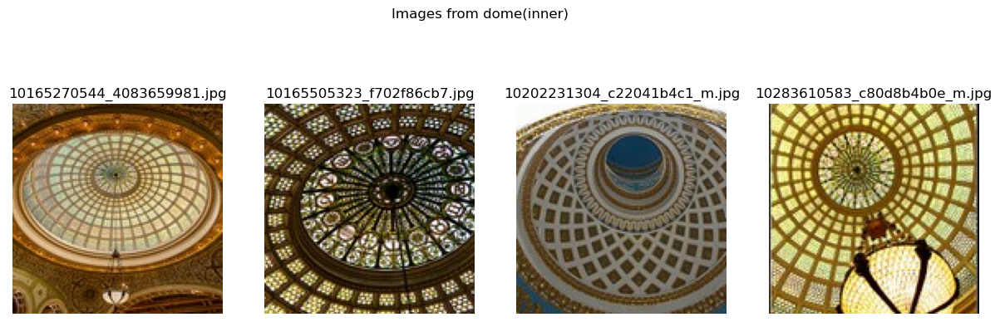

Plotting images from subdirectory: dome(outer)


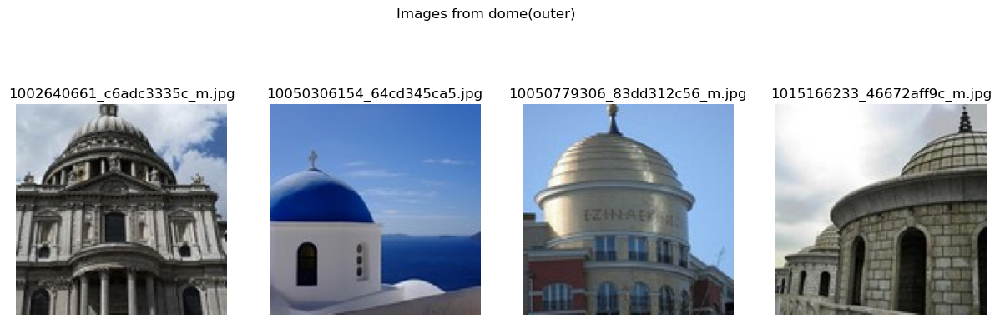

Plotting images from subdirectory: flying_buttress


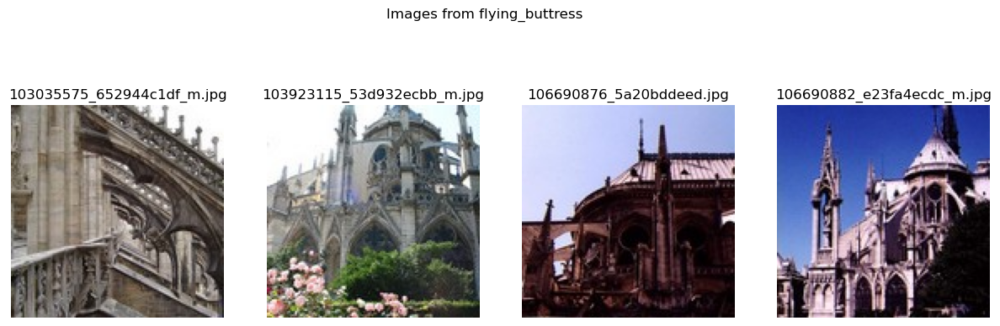

Plotting images from subdirectory: gargoyle


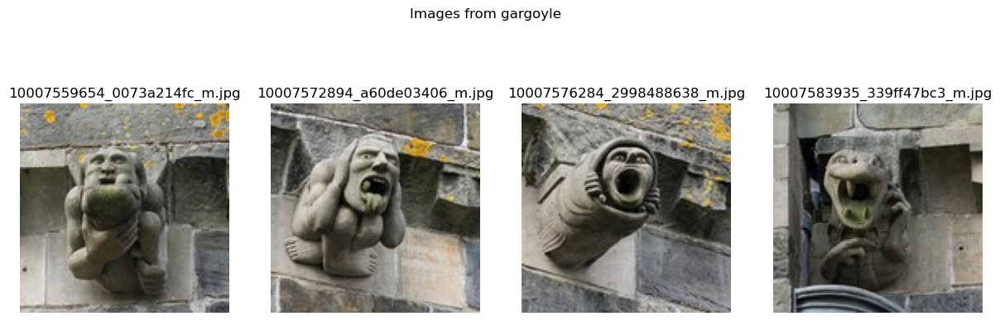

Plotting images from subdirectory: portal


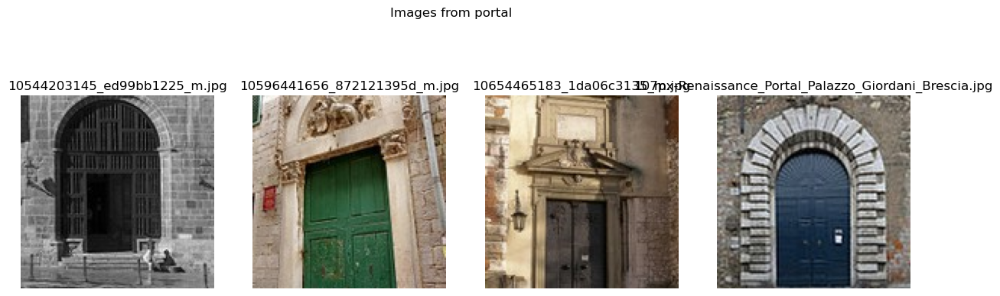

Plotting images from subdirectory: stained_glass


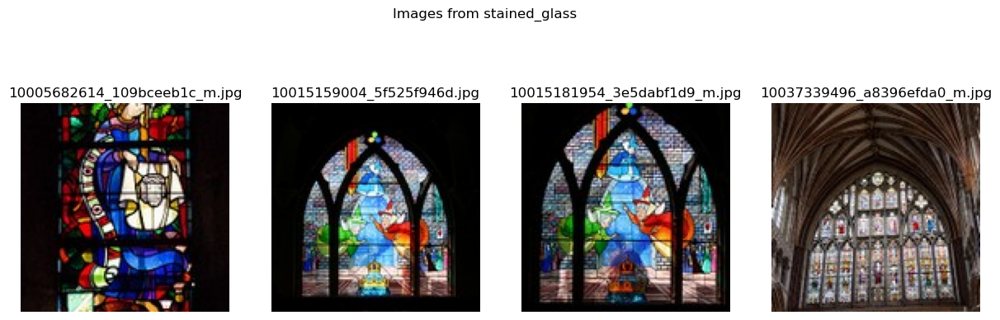

Plotting images from subdirectory: vault


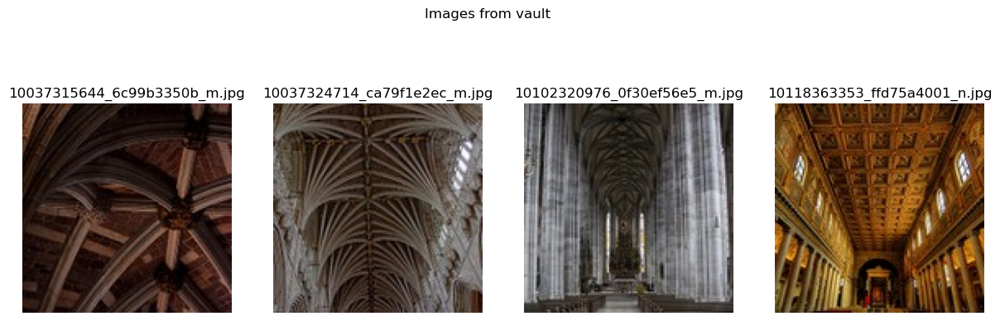

In [132]:
# Function to read and plot a limited number of images from each subdirectory
def display_images(root_directory, images_per_subdir=4):
    for subdir in os.listdir(root_directory):
        subdir_path = os.path.join(root_directory, subdir)
        if os.path.isdir(subdir_path):
            print(f"Plotting images from subdirectory: {subdir}")
            image_files = [f for f in os.listdir(subdir_path) if os.path.isfile(os.path.join(subdir_path, f))]
            
            # Select the first N images
            selected_images = image_files[:images_per_subdir]
            
            # Set up the plot
            fig, axs = plt.subplots(1, images_per_subdir, figsize=(15, 5))
            fig.suptitle(f"Images from {subdir}")
            
            for i, image_file in enumerate(selected_images):
                image_path = os.path.join(subdir_path, image_file)
                image = cv2.imread(image_path)
                if image is not None:
                    # Convert the image from BGR (OpenCV default) to RGB
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    axs[i].imshow(image)
                    axs[i].axis('off')  # Hide axes
                    axs[i].set_title(image_file)
                else:
                    print(f"Failed to read image: {image_path}")
            
            plt.show()  # Display the plot

# Path to the root directory containing the subdirectories
root_directory = r"C:\Users\Dell\OneDrive\Documents\Simplilearn_AI_progm\Simplilearn_course_materials\Capstone\Datasets\Capstone 2\Part 1\hist_structures\dataset_hist_structures\Stuctures_Dataset"

# Plot 4 images from each subdirectory
display_images(root_directory, images_per_subdir=4)

Plotting images from subdirectory: altar


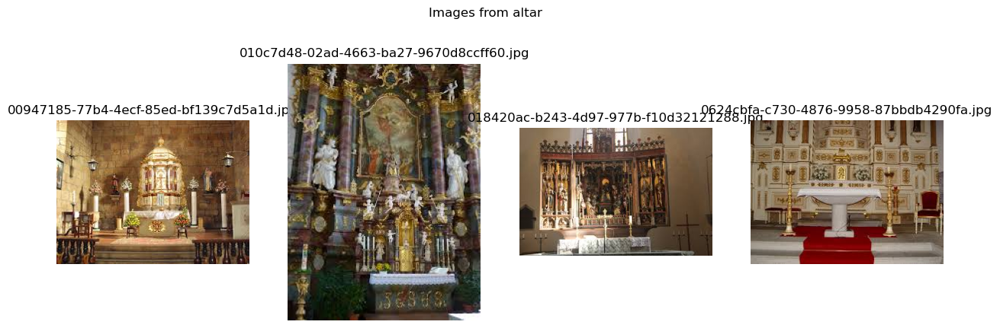

Plotting images from subdirectory: apse


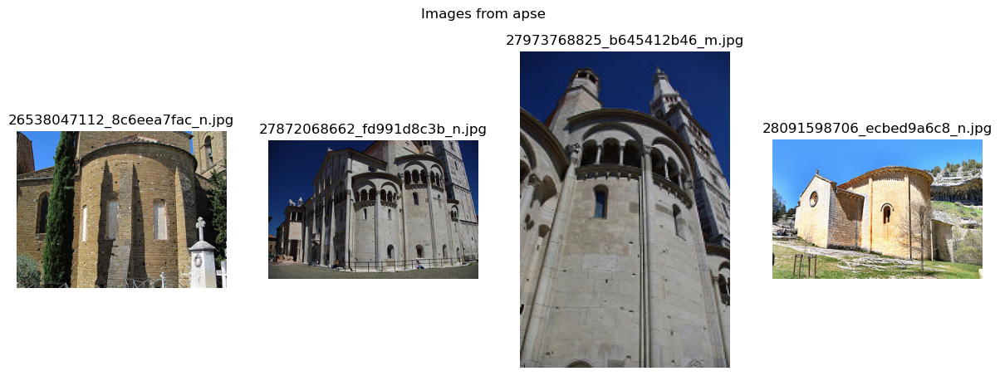

Plotting images from subdirectory: bell_tower


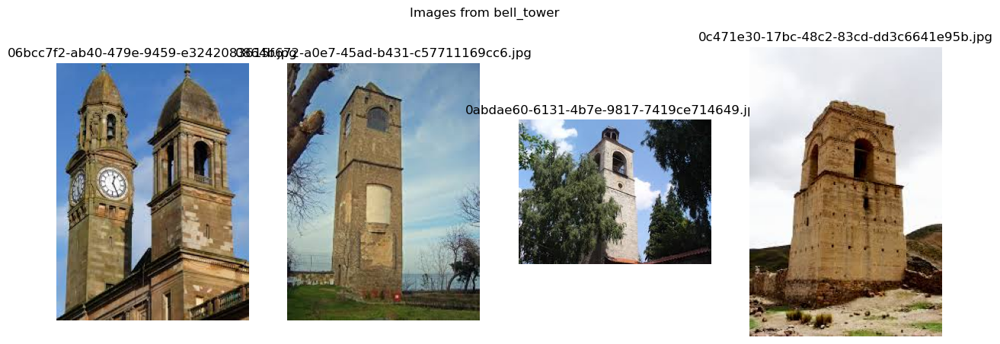

Plotting images from subdirectory: column


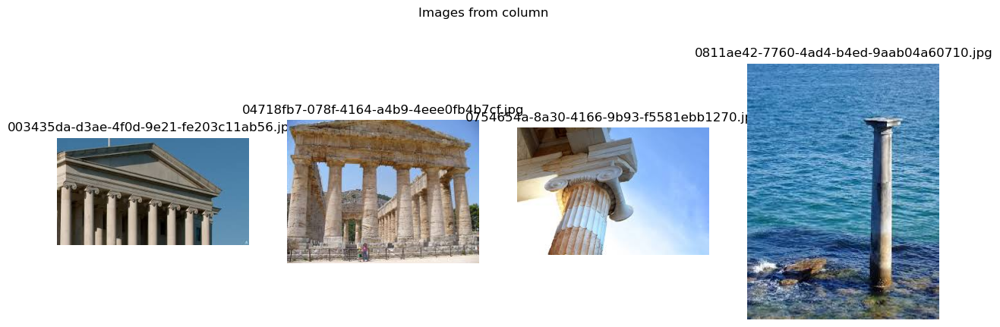

Plotting images from subdirectory: dome(inner)


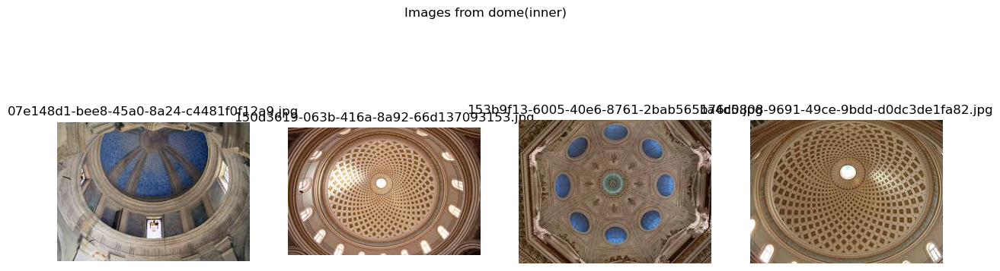

Plotting images from subdirectory: dome(outer)


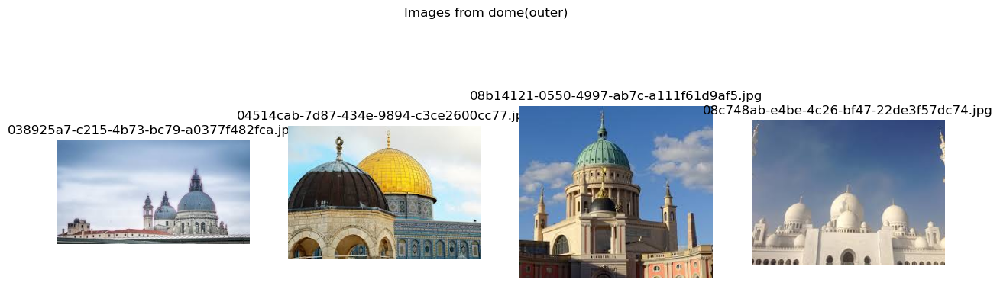

Plotting images from subdirectory: flying_buttress


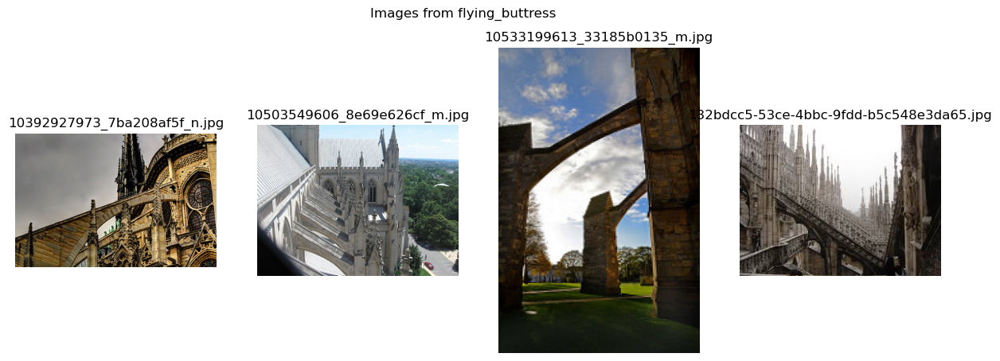

Plotting images from subdirectory: gargoyle


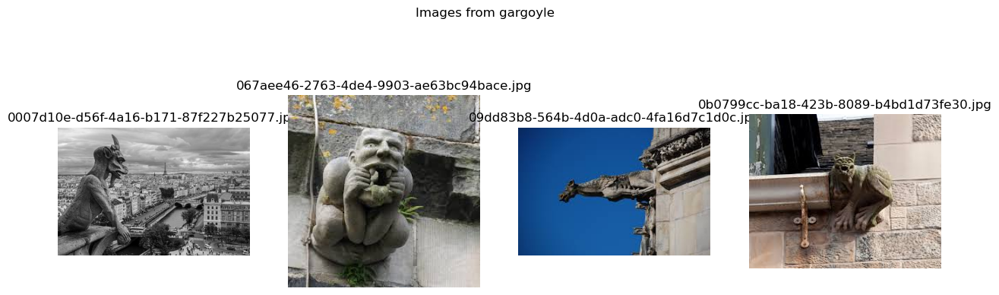

Plotting images from subdirectory: stained_glass


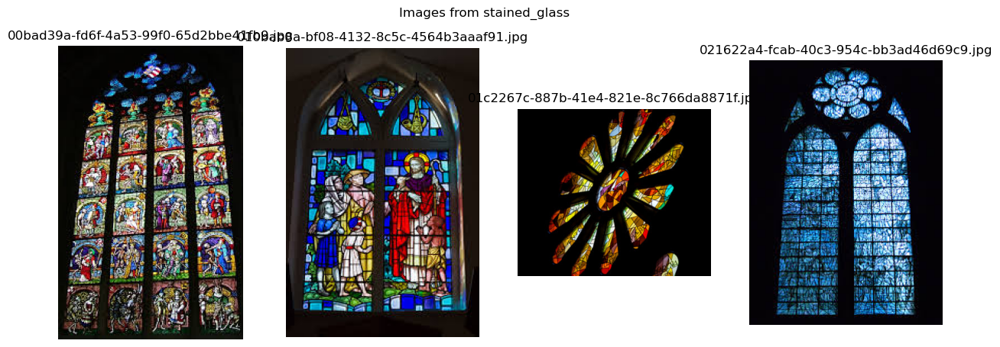

Plotting images from subdirectory: vault


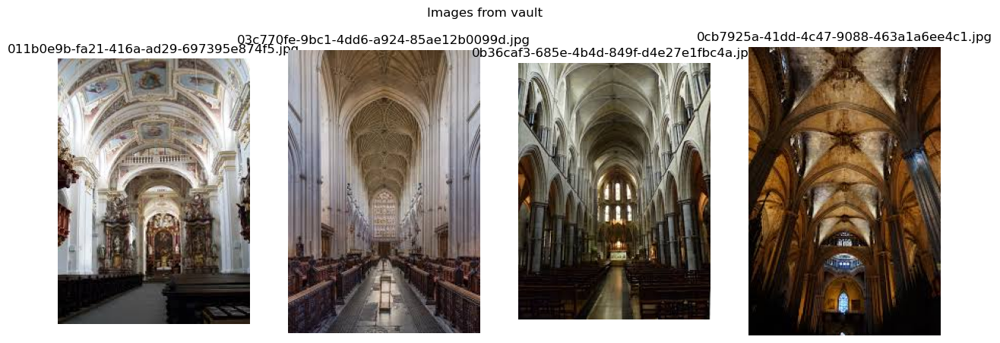

In [53]:
root_directory = r"C:\Users\Dell\OneDrive\Documents\Simplilearn_AI_progm\Simplilearn_course_materials\Capstone\Datasets\Capstone 2\Part 1\hist_structures\dataset_hist_structures\Dataset_test\Dataset_test_original_1478"

# Plot 4 images from each subdirectory
display_images(root_directory, images_per_subdir=4)
 

In [133]:
# importing libraries for building a deep learning model
import tensorflow as tf
from tensorflow.keras.applications import ResNet50, MobileNetV2, VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint

In [141]:
# Defining training and testing data path
train_data_path= r"C:\Users\Dell\OneDrive\Documents\Simplilearn_AI_progm\Simplilearn_course_materials\Capstone\Datasets\Capstone 2\Part 1\hist_structures\dataset_hist_structures\Stuctures_Dataset"
test_data_path = r"C:\Users\Dell\OneDrive\Documents\Simplilearn_AI_progm\Simplilearn_course_materials\Capstone\Datasets\Capstone 2\Part 1\hist_structures\dataset_hist_structures\Dataset_test\Dataset_test_original_1478"

In [142]:
# The below function removes the corrupt images from directory. 
# We had to write this function as during the model training errors were being thrown due to corrupt images.

from PIL import Image
def remove_corrupted_images(directory):
    for root, dirs, files in os.walk(directory):
        for file in files:
            try:
                file_path = os.path.join(root, file)
                img = Image.open(file_path)
                img.verify()  # Verify the image is not corrupted
            except (IOError, SyntaxError) as e:
                print(f"Removing corrupted image: {file_path}")
                os.remove(file_path)

# Using this function to remove corrupt images on training and validation directories
remove_corrupted_images(train_data_path)
remove_corrupted_images(test_data_path)

In [143]:
# The below function load the valid images only and skip the corrupt images
def load_images(directory):
    images = []
    for filename in os.listdir(directory):
        try:
            img = cv2.imread(os.path.join(directory, filename))
            if img is not None:
                images.append(img)
        except Exception as e:
            print(f"Skipping corrupted image: {filename}")
    return images

# Loading images from the directories
train_images = load_images(train_data_path)
test_images = load_images(test_data_path)

In [144]:
# We will check the number of classes in training and testing data. In case of mismatch we will go with common classes only in traing and testing data
# Listing of classes in training and test datasets
train_classes = os.listdir(train_data_path)
test_classes = os.listdir(test_data_path)

print("Classes in training data:", train_classes)
print("Classes in test data:", test_classes)

# Finding the class that is in training but not in the test set
missing_in_test = list(set(train_classes) - set(test_classes))
print("Classes missing in test data:", missing_in_test)

Classes in training data: ['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'portal', 'stained_glass', 'vault']
Classes in test data: ['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'stained_glass', 'vault']
Classes missing in test data: ['portal']


In [145]:
# The class portal is not present in test data, so we will not be using this class for model building.
valid_train_classes = [c for c in train_classes if c in test_classes]
print("Valid classes for training:", valid_train_classes)

Valid classes for training: ['altar', 'apse', 'bell_tower', 'column', 'dome(inner)', 'dome(outer)', 'flying_buttress', 'gargoyle', 'stained_glass', 'vault']


In [26]:
# We will be using base model as MobileNetV2 from Keras applications for transfer learning.

#base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


# Freezing the layers in the base model to prevent them from being trained initially
for layer in base_model.layers:
    layer.trainable = False

In [27]:
# Adding a global average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)

# Adding a fully connected layer with 1024 units and ReLU activation
x = Dense(1024, activation='relu')(x)

# Adding a Dropout layer with 50% rate
x = Dropout(0.5)(x)

# Adding a final output layer with softmax activation for multi-class classification
predictions = Dense(10, activation='softmax')(x)

# Creating the final model
model = Model(inputs=base_model.input, outputs=predictions)

In [28]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [29]:
# We will be using ImageDataGenerator only to rescale traing and test dataset, we will not be performing any data augmentation here.
train_datagen= ImageDataGenerator(rescale=1./255)
test_datagen= ImageDataGenerator(rescale=1./255)

# The below code helps to load the truncated images if any.
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

# Loading data from directories
train_generator = train_datagen.flow_from_directory(
    train_data_path,
    classes=valid_train_classes,# Using only the valid train classes.
    target_size=(224, 224),
    batch_size=256,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(224, 224),
    batch_size=256,
    class_mode='categorical'
)

Found 10210 images belonging to 10 classes.
Found 1457 images belonging to 10 classes.


In [30]:
# Defining callbacks to be used to train the model
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

callbacks = [early_stopping]

In [31]:
# Training the model with callbacks

history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size,
    epochs=2,  # Adjust the number of epochs as needed
    callbacks=callbacks
)

Epoch 1/2


C:\Users\Dell\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


39/39 ━━━━━━━━━━━━━━━━━━━━ 386s 9s/step - accuracy: 0.7358 - loss: 0.8403 - val_accuracy: 0.9211 - val_loss: 0.2388
Epoch 2/2
 1/39 ━━━━━━━━━━━━━━━━━━━━ 3:39 6s/step - accuracy: 0.9297 - loss: 0.2474

C:\Users\Dell\anaconda3\Lib\contextlib.py:155: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


39/39 ━━━━━━━━━━━━━━━━━━━━ 13s 185ms/step - accuracy: 0.9297 - loss: 0.2474 - val_accuracy: 0.8757 - val_loss: 0.3289


In [32]:
# Evaluating the loss and accuracy of testing dataset
loss, accuracy = model.evaluate(test_generator)
print(f'Validation Accuracy: {accuracy * 100:.2f}%')

6/6 ━━━━━━━━━━━━━━━━━━━━ 63s 7s/step - accuracy: 0.9126 - loss: 0.2503
Validation Accuracy: 91.49%


In [33]:
# We will now perform Data Augmentation to check if accuracy of our model is impacted.

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = ImageDataGenerator(rescale=1./255)


from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True


train_generator = train_datagen.flow_from_directory(
    train_data_path,
    classes=valid_train_classes,
    target_size=(224, 224),
    batch_size=256,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_data_path,
    target_size=(224, 224),
    batch_size=256,
    class_mode='categorical'
)

Found 10210 images belonging to 10 classes.
Found 1457 images belonging to 10 classes.


In [34]:
# Defining callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

callbacks = [early_stopping]

In [35]:
# Training the model with callbacks

history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size,
    epochs=2,  # Adjust the number of epochs as needed
    callbacks=callbacks
)

Epoch 1/2


C:\Users\Dell\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


39/39 ━━━━━━━━━━━━━━━━━━━━ 852s 19s/step - accuracy: 0.8195 - loss: 0.6113 - val_accuracy: 0.9156 - val_loss: 0.2449
Epoch 2/2
 1/39 ━━━━━━━━━━━━━━━━━━━━ 5:55 9s/step - accuracy: 0.8633 - loss: 0.4109

C:\Users\Dell\anaconda3\Lib\contextlib.py:155: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


39/39 ━━━━━━━━━━━━━━━━━━━━ 29s 509ms/step - accuracy: 0.8633 - loss: 0.4109 - val_accuracy: 0.9153 - val_loss: 0.2944


In [36]:
loss, accuracy = model.evaluate(test_generator)
print(f'Validation Accuracy: {accuracy * 100:.2f}%')

6/6 ━━━━━━━━━━━━━━━━━━━━ 65s 9s/step - accuracy: 0.9190 - loss: 0.2479
Validation Accuracy: 91.56%


#### The accuracy of the model increased only marginally after data augmentation

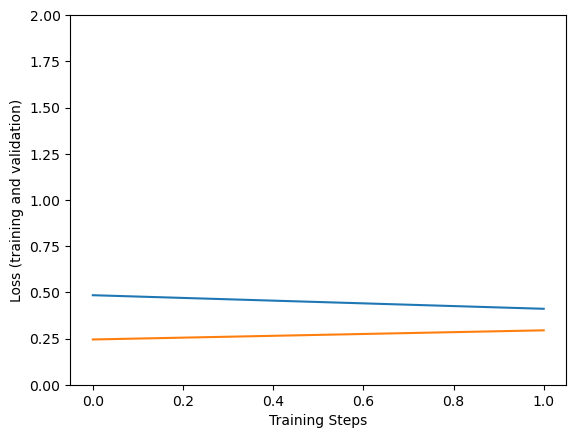

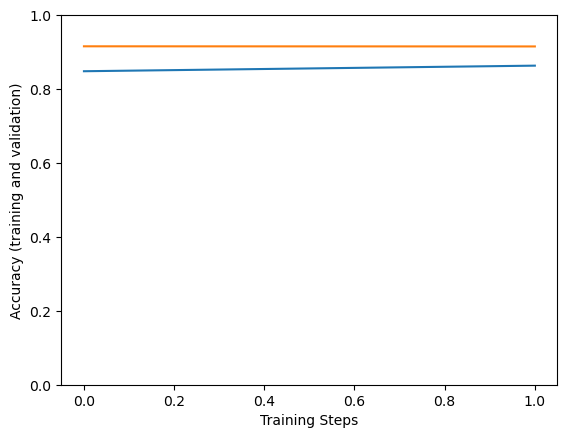

In [39]:
# Plotting traing and validation loss and accuracy graph
plt.figure()
plt.ylabel("Loss (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,2])
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])

plt.figure()
plt.ylabel("Accuracy (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,1])
plt.plot(history.history["accuracy"])
plt.plot(history.history["val_accuracy"])

### Part 2

In [34]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [35]:
# importing data
user_data=pd.read_csv(r'Datasets\Capstone 2\Part 2\user.csv')
tourism_rating_data=pd.read_csv(r'Datasets\Capstone 2\Part 2\tourism_rating.csv')
tourism_with_id_data= pd.read_excel(r'Datasets\Capstone 2\Part 2\tourism_with_id.xlsx')

In [36]:
# We will be performing EDA and look at the data
user_data.head()

,User_Id,Location,Age
0,1,"Semarang, Jawa Tengah",20
1,2,"Bekasi, Jawa Barat",21
2,3,"Cirebon, Jawa Barat",23
3,4,"Bekasi, Jawa Barat",21
4,5,"Lampung, Sumatera Selatan",20


In [37]:
tourism_rating_data.head()

,User_Id,Place_Id,Place_Ratings
0,1,179,3
1,1,344,2
2,1,5,5
3,1,373,3
4,1,101,4


In [38]:
tourism_with_id_data.head()

,Place_Id,Place_Name,Description,Category,City,Price,Rating,Time_Minutes,Coordinate,Lat,Long,Unnamed: 11,Unnamed: 12
0,1,Monumen Nasional,Monumen Nasional atau yang populer disingkat d...,Budaya,Jakarta,20000,4.6,15.0,"{'lat': -6.1753924, 'lng': 106.8271528}",-6.175392,106.827153,NaN,1
1,2,Kota Tua,"Kota tua di Jakarta, yang juga bernama Kota Tu...",Budaya,Jakarta,0,4.6,90.0,"{'lat': -6.137644799999999, 'lng': 106.8171245}",-6.137645,106.817125,NaN,2
2,3,Dunia Fantasi,Dunia Fantasi atau disebut juga Dufan adalah t...,Taman Hiburan,Jakarta,270000,4.6,360.0,"{'lat': -6.125312399999999, 'lng': 106.8335377}",-6.125312,106.833538,NaN,3
3,4,Taman Mini Indonesia Indah (TMII),Taman Mini Indonesia Indah merupakan suatu kaw...,Taman Hiburan,Jakarta,10000,4.5,NaN,"{'lat': -6.302445899999999, 'lng': 106.8951559}",-6.302446,106.895156,NaN,4
4,5,Atlantis Water Adventure,Atlantis Water Adventure atau dikenal dengan A...,Taman Hiburan,Jakarta,94000,4.5,60.0,"{'lat': -6.12419, 'lng': 106.839134}",-6.124190,106.839134,NaN,5


In [39]:
# We will be analyzing the Place_Ratings in tourism_rating_data and Rating in tourism_with_id_data as they are quite common.
tourism_rating_data['Place_Ratings'].value_counts()

Place_Ratings
4    2106
3    2096
2    2071
5    2021
1    1706
Name: count, dtype: int64

In [40]:
tourism_with_id_data['Rating'].value_counts()

Rating
4.5    98
4.4    98
4.6    75
4.3    47
4.7    37
4.2    20
4.1    20
4.0    18
4.8    10
5.0     4
4.9     4
3.9     3
3.8     2
3.4     1
Name: count, dtype: int64

In [41]:
 # Checking for null values
user_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   User_Id   300 non-null    int64 
 1   Location  300 non-null    object
 2   Age       300 non-null    int64 
dtypes: int64(2), object(1)
memory usage: 7.2+ KB


In [42]:
tourism_rating_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   User_Id        10000 non-null  int64
 1   Place_Id       10000 non-null  int64
 2   Place_Ratings  10000 non-null  int64
dtypes: int64(3)
memory usage: 234.5 KB


In [43]:
tourism_with_id_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 437 entries, 0 to 436
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Place_Id      437 non-null    int64  
 1   Place_Name    437 non-null    object 
 2   Description   437 non-null    object 
 3   Category      437 non-null    object 
 4   City          437 non-null    object 
 5   Price         437 non-null    int64  
 6   Rating        437 non-null    float64
 7   Time_Minutes  205 non-null    float64
 8   Coordinate    437 non-null    object 
 9   Lat           437 non-null    float64
 10  Long          437 non-null    float64
 11  Unnamed: 11   0 non-null      float64
 12  Unnamed: 12   437 non-null    int64  
dtypes: float64(5), int64(3), object(5)
memory usage: 44.5+ KB


In [44]:
# We will be dropping the columns 'Unnamed: 11' and 'Unnamed: 12' as they are of no use, also the 
# column Time_Minutes has more than 50% null values. It will be dropped too.

tourism_with_id_data.drop(columns=['Unnamed: 11','Unnamed: 12', 'Time_Minutes'], inplace=True)
tourism_with_id_data



,Place_Id,Place_Name,Description,Category,City,Price,Rating,Coordinate,Lat,Long
0,1,Monumen Nasional,Monumen Nasional atau yang populer disingkat d...,Budaya,Jakarta,20000,4.6,"{'lat': -6.1753924, 'lng': 106.8271528}",-6.175392,106.827153
1,2,Kota Tua,"Kota tua di Jakarta, yang juga bernama Kota Tu...",Budaya,Jakarta,0,4.6,"{'lat': -6.137644799999999, 'lng': 106.8171245}",-6.137645,106.817125
2,3,Dunia Fantasi,Dunia Fantasi atau disebut juga Dufan adalah t...,Taman Hiburan,Jakarta,270000,4.6,"{'lat': -6.125312399999999, 'lng': 106.8335377}",-6.125312,106.833538
3,4,Taman Mini Indonesia Indah (TMII),Taman Mini Indonesia Indah merupakan suatu kaw...,Taman Hiburan,Jakarta,10000,4.5,"{'lat': -6.302445899999999, 'lng': 106.8951559}",-6.302446,106.895156
4,5,Atlantis Water Adventure,Atlantis Water Adventure atau dikenal dengan A...,Taman Hiburan,Jakarta,94000,4.5,"{'lat': -6.12419, 'lng': 106.839134}",-6.124190,106.839134
...,...,...,...,...,...,...,...,...,...,...
432,433,Museum Mpu Tantular,Museum Negeri Mpu Tantular adalah sebuah museu...,Budaya,Surabaya,2000,4.4,"{'lat': -7.4338593, 'lng': 112.7199058}",-7.433859,112.719906
433,434,Taman Bungkul,Taman Bungkul adalah taman wisata kota yang te...,Taman Hiburan,Surabaya,0,4.6,"{'lat': -7.291346799999999, 'lng': 112.7398218}",-7.291347,112.739822
434,435,Taman Air Mancur Menari Kenjeran,Air mancur menari atau dancing fountain juga a...,Taman Hiburan,Surabaya,0,4.4,"{'lat': -7.2752955, 'lng': 112.7549381}",-7.275296,112.754938
435,436,Taman Flora Bratang Surabaya,Taman Flora adalah salah satu taman kota di Su...,Taman Hiburan,Surabaya,0,4.6,"{'lat': -7.294330299999999, 'lng': 112.7617534}",-7.294330,112.761753


### 2. To understand the tourism highlights better, we should explore the data in depth.
     I. Explore the user group that provides the tourism ratings by:
    • Analyzing the age distribution of users visiting the places and rating them 
    • Identifying the places where most of these users (tourists) are coming from


In [156]:
# Let's analyze the age distribution
user_data['Age'].value_counts()

Age
30    21
29    17
27    17
38    16
20    16
28    16
25    15
18    15
34    14
31    14
32    14
37    13
21    13
39    13
24    13
19    12
33    12
23    11
26     9
35     9
40     7
22     7
36     6
Name: count, dtype: int64

In [157]:
# Creating bins to group the age
bins =[0,18,30,40]
labels=['Teenager', 'Young Adult', 'Adult']
user_data['Age_Group']=pd.cut(user_data['Age'], bins=bins, labels=labels)

In [47]:
user_data.head()

,User_Id,Location,Age,Age_Group
0,1,"Semarang, Jawa Tengah",20,Young Adult
1,2,"Bekasi, Jawa Barat",21,Young Adult
2,3,"Cirebon, Jawa Barat",23,Young Adult
3,4,"Bekasi, Jawa Barat",21,Young Adult
4,5,"Lampung, Sumatera Selatan",20,Young Adult


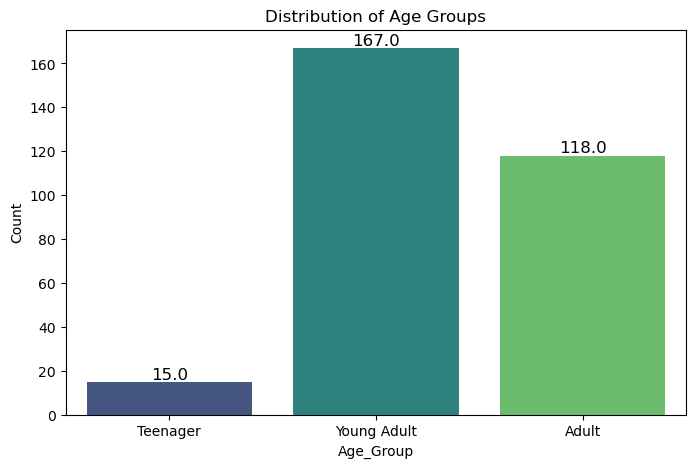

In [48]:
# Plotting with Seaborn
plt.figure(figsize=(8, 5))
ax=sns.countplot(x='Age_Group', data=user_data, palette='viridis')
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 2), 
                textcoords='offset points')

plt.title('Distribution of Age Groups')
plt.xlabel('Age_Group')
plt.ylabel('Count')
plt.show()

##### Conclusion: Most of the tourists are in the age group range of 18-30 years.

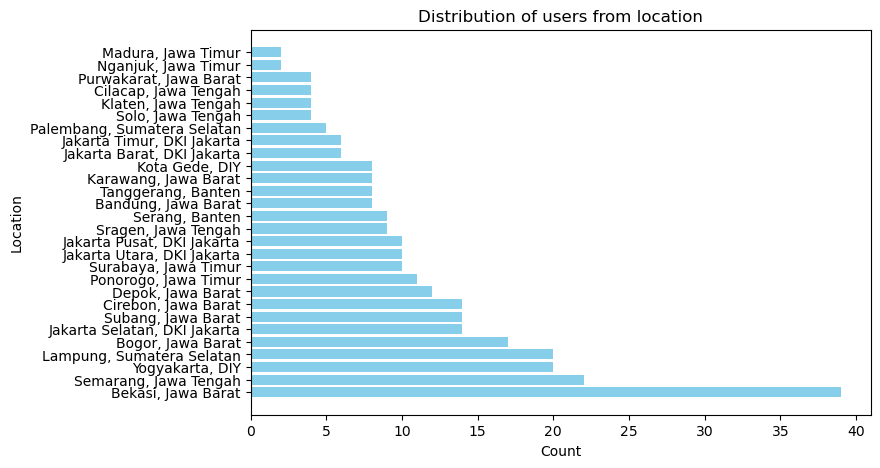

In [49]:
# Let's analyze the users coming from different locations
counts= user_data['Location'].value_counts()
plt.figure(figsize=(8,5))
plt.barh(counts.index,counts.values, color='skyblue')
plt.title('Distribution of users from location')
plt.xlabel('Count')
plt.ylabel('Location')
plt.show()

##### Conclusion: Most of the tourists are coming from Bekasi followed by Semarang and then Yogyakarta

### 3. Next, let's explore the locations and categories of tourist spots.
     I. What are the different categories of tourist spots?
    II. What kind of tourism each location is most famous or suitable for?
    III. Which city would be best for a nature enthusiast to visit?

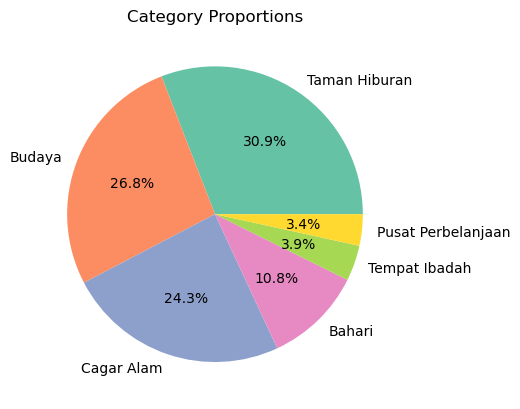

In [158]:
# Let's analyze the different categoies of tourists spot
tourism_with_id_data['Category'].value_counts().plot.pie(autopct='%1.1f%%', colors=sns.color_palette('Set2'))
plt.title('Category Proportions')
plt.ylabel('')
plt.show()

C:\Users\Dell\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight

C:\Users\Dell\AppData\Local\Temp\ipykernel_13764\672320270.py:8: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\Dell\AppData\Local\Temp\ipykernel_13764\672320270.py:9: UserWarning:

FixedFormatter should only be used together with FixedLocator



<Figure size 1000x500 with 0 Axes>

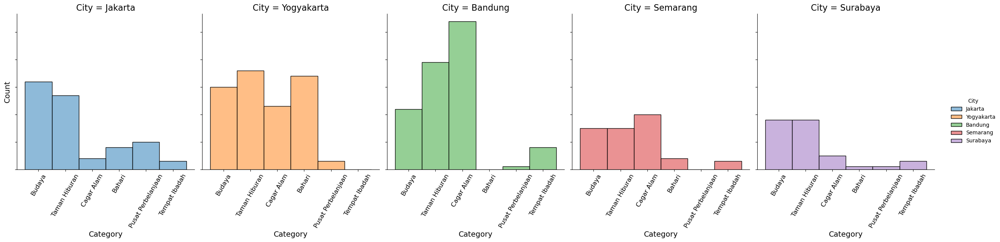

In [177]:
# Let's analyze the tourist category based on the location.
plt.figure(figsize=(10, 5))
g= sns.displot(data=tourism_with_id_data, x="Category", hue="City", col="City")

# Iterate through each subplot (facet)
for ax in g.axes.flat:
    # Set the font size for x and y tick labels
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=12, rotation=60)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)

    # Set the font size for x and y axis labels
    ax.set_xlabel('Category', fontsize=14)
    ax.set_ylabel('Count', fontsize=14)

    # Set the font size for subplot (facet) titles
    ax.set_title(ax.get_title(), fontsize=16)

# Set the font size for the legend
g._legend.set_title('City')
#g._legend.set_title_fontsize(14)
#g._legend.set_fontsize(12)

# Show the plot
plt.show()


##### Conclusion: 
##### 1) Based on the above graph, City Jakarta is most famous for Budaya category, City Yogyakarta is most famous for Taman Hiburan category, City Bandung and City Semarang is most famous for Cagar Alam category and City Surabaya is most famous for Budaya and Taman Hiburn both.

##### 2) City Badung has most numbers of Cagar Alam, so Badung is most suitable for nature enthusiast.

### 4. To better understand tourism, we need to create a combined data with places and their user ratings.
    I. Use this data to figure out the spots that are most loved by the tourists. Also, which city has the most loved tourist    spots?
    II. Indonesia provides a wide range of tourist spots ranging from historical and cultural beauties to advanced amusement parks. Among these, which category of places are users liking the most

In [154]:
tourism_rating_data.head()

,User_Id,Place_Id,Place_Ratings
0,1,179,3
1,1,344,2
2,1,5,5
3,1,373,3
4,1,101,4


In [53]:
# Applying groupby function to group the Place ID alongwith the mean of the place ratings.
tourism_rating_data1=tourism_rating_data.groupby('Place_Id').mean().reset_index()



In [178]:
# Checking to find the if the mean rating of a place in tourism rating data is same as that of the place in tourism with id data. The ratings are not same, we will take mean of the ratings after merging the data.
tourism_with_id_data[tourism_with_id_data['Place_Id']==344]

,Place_Id,Place_Name,Description,Category,City,Price,Rating,Coordinate,Lat,Long
343,344,Pantai Marina,Pantai Marina (bahasa Jawa: Í¶•Í¶±Í¶∂Í¶±Í¶∂Í¶Ç...,Bahari,Semarang,3000,4.1,"{'lat': -6.948877, 'lng': 110.3893285}",-6.948877,110.389329


In [181]:
# Merging the data of tourism rating data and tourism with id data
merge_tourism_data=pd.merge(tourism_rating_data1.drop(columns=['User_Id']), tourism_with_id_data, on='Place_Id')

In [182]:
# We are taking mean of the ratings here from both dataset
merge_tourism_data['Mean_Rating']=merge_tourism_data[['Place_Ratings', 'Rating']].mean(axis=1).round(2)

In [183]:
# Displaying the dataframe after merge and mean.
merge_tourism_data.head()

,Place_Id,Place_Ratings,Place_Name,Description,Category,City,Price,Rating,Coordinate,Lat,Long,Mean_Rating
0,1,3.722222,Monumen Nasional,Monumen Nasional atau yang populer disingkat d...,Budaya,Jakarta,20000,4.6,"{'lat': -6.1753924, 'lng': 106.8271528}",-6.175392,106.827153,4.16
1,2,2.840000,Kota Tua,"Kota tua di Jakarta, yang juga bernama Kota Tu...",Budaya,Jakarta,0,4.6,"{'lat': -6.137644799999999, 'lng': 106.8171245}",-6.137645,106.817125,3.72
2,3,2.526316,Dunia Fantasi,Dunia Fantasi atau disebut juga Dufan adalah t...,Taman Hiburan,Jakarta,270000,4.6,"{'lat': -6.125312399999999, 'lng': 106.8335377}",-6.125312,106.833538,3.56
3,4,2.857143,Taman Mini Indonesia Indah (TMII),Taman Mini Indonesia Indah merupakan suatu kaw...,Taman Hiburan,Jakarta,10000,4.5,"{'lat': -6.302445899999999, 'lng': 106.8951559}",-6.302446,106.895156,3.68
4,5,3.520000,Atlantis Water Adventure,Atlantis Water Adventure atau dikenal dengan A...,Taman Hiburan,Jakarta,94000,4.5,"{'lat': -6.12419, 'lng': 106.839134}",-6.124190,106.839134,4.01


In [184]:
# Taking top 10 subset of data to analyze our findings.
subdata_top10=merge_tourism_data.nlargest(10, 'Mean_Rating')
subdata_top10

,Place_Id,Place_Ratings,Place_Name,Description,Category,City,Price,Rating,Coordinate,Lat,Long,Mean_Rating
138,139,3.882353,Puncak Gunung Api Purba - Nglanggeran,Gunung Nglanggeran adalah sebuah gunung di Dae...,Cagar Alam,Yogyakarta,10000,4.7,"{'lat': -7.841252999999998, 'lng': 110.543056}",-7.841253,110.543056,4.29
278,279,3.642857,Masjid Agung Trans Studio Bandung,Masjid Agung Trans Studio Bandung (TSB) berdir...,Tempat Ibadah,Bandung,0,4.8,"{'lat': -6.925963500000001, 'lng': 107.6354278}",-6.925963,107.635428,4.22
415,416,3.967742,Keraton Surabaya,Kawasan yang berjuluk Kampung Keraton ini terd...,Budaya,Surabaya,0,4.4,"{'lat': -7.256755299999998, 'lng': 112.7942203}",-7.256755,112.794220,4.18
43,44,3.631579,Monumen Selamat Datang,Monumen Selamat Datang adalah sebuah monumen y...,Budaya,Jakarta,0,4.7,"{'lat': -6.194997799999999, 'lng': 106.8230496}",-6.194998,106.823050,4.17
51,52,3.842105,Kampung Cina,KAMPUNG China adalah hunian dan kawasan perdag...,Budaya,Jakarta,15000,4.5,"{'lat': -6.3651357, 'lng': 106.7617984}",-6.365136,106.761798,4.17
0,1,3.722222,Monumen Nasional,Monumen Nasional atau yang populer disingkat d...,Budaya,Jakarta,20000,4.6,"{'lat': -6.1753924, 'lng': 106.8271528}",-6.175392,106.827153,4.16
68,69,3.320000,Freedom Library,Freedom Library adalah perpustakaan buku yang ...,Budaya,Jakarta,0,5.0,"{'lat': -6.202248200000001, 'lng': 106.8451968}",-6.202248,106.845197,4.16
94,95,3.320000,Desa Wisata Sungai Code Jogja Kota,"Kampung Code berada di Kelurahan Kotabaru, Kec...",Taman Hiburan,Yogyakarta,0,5.0,"{'lat': -7.822908900000001, 'lng': 110.3756894}",-7.822909,110.375689,4.16
96,97,3.772727,Monumen Yogya Kembali,Museum Monumen Yogya Kembali (bahasa Jawa: Í¶©...,Budaya,Yogyakarta,15000,4.5,"{'lat': -7.7495904, 'lng': 110.3696068}",-7.749590,110.369607,4.14
111,112,3.764706,Bukit Bintang Yogyakarta,Bukit Bintang merupakan salah satu lokasi nong...,Taman Hiburan,Yogyakarta,25000,4.5,"{'lat': -7.845840699999997, 'lng': 110.4798457}",-7.845841,110.479846,4.13


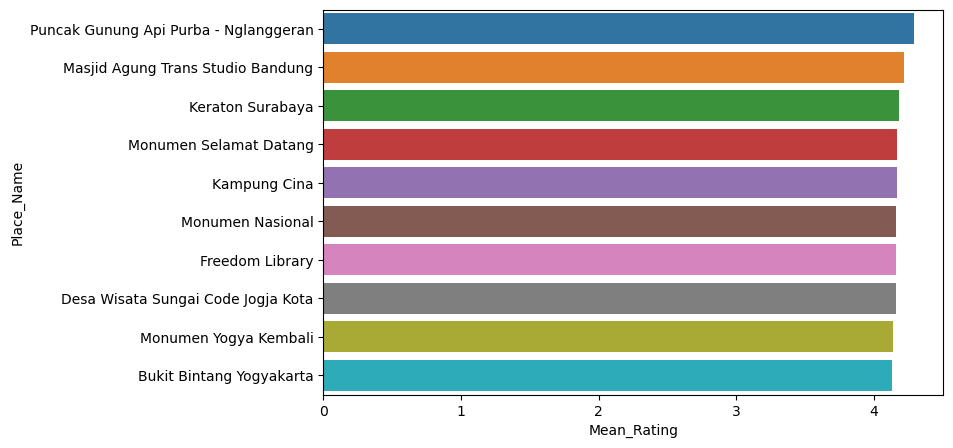

In [60]:
plt.figure(figsize=(8,5))
sns.barplot(x = 'Mean_Rating',
            y = 'Place_Name',
            data = subdata_top10)
plt.show()

##### Conclusion: The place 'Puncak Gunung Api Purba - Nglanggeran' in the city 'Yogyakarta' has the highest mean rating and is most loved by the tourist.

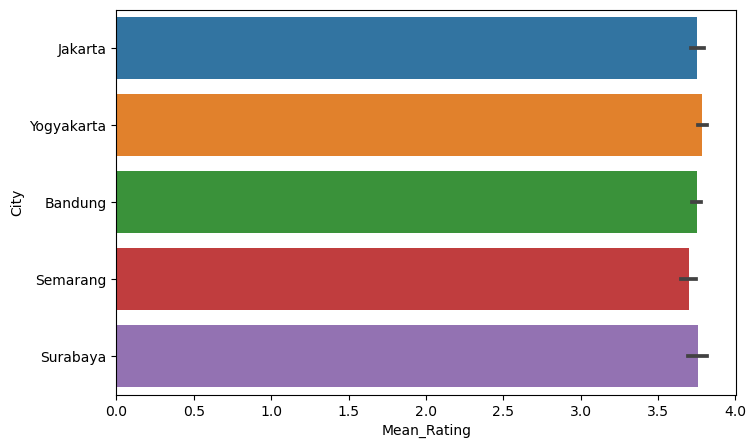

In [185]:
plt.figure(figsize=(8,5))
sns.barplot(x = 'Mean_Rating',
            y = 'City',
            data = merge_tourism_data)
plt.show()

##### Conclusion: The city Yogyakarta has the highest rating for the tourist attractions. 

In [62]:
subdata_category_rating=merge_tourism_data.groupby('Category')['Mean_Rating'].mean().reset_index()

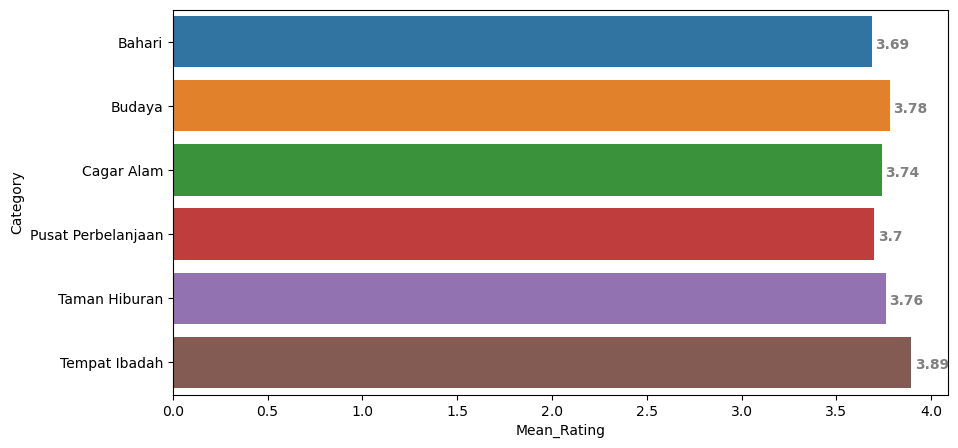

In [63]:
plt.figure(figsize=(10,5))
ax=sns.barplot(x = 'Mean_Rating',
            y = 'Category',
            data = subdata_category_rating)
for i in ax.patches:
    plt.text(i.get_width()+0.02, i.get_y()+0.5, 
             str(round((i.get_width()), 2)),
             fontsize = 10, fontweight ='bold',
             color ='grey')
plt.show()

##### Conclusion: The category 'Tempat Ibadah' has the highest rating and most loved by the tourists.

###  5. Build a recommender model for the system
    I. Use the above data to develop a collaborative filtering model for recommendation and use that to recommend other places to visit using the current tourist location(place name)

In [110]:
import numpy as np
import pandas as pd
from surprise import Dataset
from surprise import Reader
from surprise import KNNBasic, KNNWithMeans, SVD,SVDpp,SlopeOne,NMF,NormalPredictor,KNNBaseline,KNNWithZScore,BaselineOnly,CoClustering

In [90]:
tourism_rating_data

,User_Id,Place_Id,Place_Ratings
0,1,179,3
1,1,344,2
2,1,5,5
3,1,373,3
4,1,101,4
...,...,...,...
9995,300,425,2
9996,300,64,4
9997,300,311,3
9998,300,279,4


In [108]:
# We will be using the Surprise library to build our recommendation engine.
reader = Reader(rating_scale=(1, 5))
data= Dataset.load_from_df(tourism_rating_data[['User_Id', 'Place_Id', 'Place_Ratings']], reader)

In [122]:
benchmark = []
# Iterating over all the alogs to find out the best algo to be used for our recommendation engine
for algorithm in [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(), KNNBaseline(), KNNBasic(), KNNWithMeans(), KNNWithZScore(), BaselineOnly(), CoClustering()]:
    # Perform cross validation
    results = cross_validate(algorithm, data, measures=['RMSE'], cv=3, verbose=False)
    
    # Get results & append algorithm name
    tmp = pd.DataFrame.from_dict(results).mean(axis=0)
    algorithm_series = pd.Series([str(algorithm).split(' ')[0].split('.')[-1]], index=['Algorithm'])
    tmp = pd.concat([tmp, algorithm_series])
    benchmark.append(tmp)
    
pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')  

Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...


,test_rmse,fit_time,test_time
Algorithm,,,
BaselineOnly,1.397522,0.010296,0.015898
SVD,1.420179,0.150565,0.045582
SVDpp,1.441866,0.372364,0.248388
KNNBasic,1.490452,0.007483,0.089330
KNNWithMeans,1.501549,0.010769,0.069961
KNNBaseline,1.506531,0.020880,0.120666
KNNWithZScore,1.511927,0.040322,0.107467
CoClustering,1.528692,0.285788,0.026808
SlopeOne,1.556646,0.021360,0.078556


In [123]:
# We will be going with BaselineOnly algo as it has the least rmse value.

bsl_options = {'method': 'als',
               'n_epochs': 5,
               'reg_u': 12,
               'reg_i': 5
               }
algo = BaselineOnly(bsl_options=bsl_options)
cross_validate(algo, data, measures=['RMSE'], cv=3, verbose=False)

Estimating biases using als...
Estimating biases using als...
Estimating biases using als...


{'test_rmse': array([1.41004313, 1.4071041 , 1.41069025]),
 'fit_time': (0.008185863494873047,
  0.00522303581237793,
  0.0059969425201416016),
 'test_time': (0.016179561614990234,
  0.011106491088867188,
  0.011663675308227539)}

In [124]:
# Splitting the dataset for training and testing set.
from surprise.model_selection import train_test_split
trainset, testset = train_test_split(data, test_size=0.25)
algo = BaselineOnly(bsl_options=bsl_options)
predictions = algo.fit(trainset).test(testset)
accuracy.rmse(predictions)

Estimating biases using als...
RMSE: 1.4068


1.406809619161051

In [125]:
# The below code creates a dataframe to show the best and worst recommendation based on the output of our model
def get_Iu(uid):
    """ return the number of items rated by given user
    args: 
      uid: the id of the user
    returns: 
      the number of items rated by the user
    """
    try:
        return len(trainset.ur[trainset.to_inner_uid(uid)])
    except ValueError: # user was not part of the trainset
        return 0
    
def get_Ui(iid):
    """ return number of users that have rated given item
    args:
      iid: the raw id of the item
    returns:
      the number of users that have rated the item.
    """
    try: 
        return len(trainset.ir[trainset.to_inner_iid(iid)])
    except ValueError:
        return 0
    
df = pd.DataFrame(predictions, columns=['uid', 'iid', 'rui', 'est', 'details'])
df['Iu'] = df.uid.apply(get_Iu)
df['Ui'] = df.iid.apply(get_Ui)
df['err'] = abs(df.est - df.rui)
best_predictions = df.sort_values(by='err')[:10]
worst_predictions = df.sort_values(by='err')[-10:]

In [126]:
best_predictions

,uid,iid,rui,est,details,Iu,Ui,err
990,273,197,3.0,3.000293,{'was_impossible': False},24,19,0.000293
1227,33,268,3.0,2.999468,{'was_impossible': False},32,19,0.000532
934,153,156,3.0,3.000590,{'was_impossible': False},15,19,0.000590
1608,158,233,3.0,3.001005,{'was_impossible': False},27,22,0.001005
442,102,231,3.0,3.001781,{'was_impossible': False},25,11,0.001781
2003,127,149,3.0,3.001927,{'was_impossible': False},22,16,0.001927
438,187,368,3.0,3.002221,{'was_impossible': False},27,23,0.002221
1892,223,426,3.0,3.003137,{'was_impossible': False},27,13,0.003137
1549,240,416,4.0,3.996639,{'was_impossible': False},21,20,0.003361
2123,244,299,3.0,3.004118,{'was_impossible': False},21,13,0.004118


##### Conclusion:  The recommendation engine is predicting the place ids 24 and 19 for a user id 273 who has visted a place with place id 197 and so on.

In [127]:
worst_predictions

,uid,iid,rui,est,details,Iu,Ui,err
848,106,186,1.0,3.789217,{'was_impossible': False},25,12,2.789217
1372,169,34,1.0,3.796692,{'was_impossible': False},17,19,2.796692
512,186,138,1.0,3.799998,{'was_impossible': False},23,16,2.799998
1036,123,226,5.0,2.193991,{'was_impossible': False},22,20,2.806009
354,79,416,1.0,3.810511,{'was_impossible': False},28,20,2.810511
153,123,76,5.0,2.172089,{'was_impossible': False},22,18,2.827911
58,169,407,1.0,3.828114,{'was_impossible': False},17,19,2.828114
263,230,115,1.0,3.831759,{'was_impossible': False},31,15,2.831759
229,169,131,1.0,3.979935,{'was_impossible': False},17,16,2.979935
2215,88,150,5.0,1.905831,{'was_impossible': False},19,12,3.094169
